In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import torchvision
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from IPython.display import display, clear_output
import os

# Check GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")


Using device: cuda
GPU: Tesla T4


In [ ]:
# Hyperparameters & Config
# ─────────────────────────────────────────────────────────────────────────────
# Shared config
IMAGE_SIZE   = 32       # resize CIFAR-10 images to 64x64
NC           = 3        # number of image channels (RGB)
NZ           = 100      # latent vector dimension
NGF          = 64       # generator feature map size
NDF          = 64       # discriminator feature map size
BATCH_SIZE   = 256
NUM_EPOCHS   = 40       # increase for better results (50–100 recommended)
LR           = 0.0002
BETA1        = 0.5      # Adam β1

CIFAR_CLASSES = ['airplane','automobile','bird','cat','deer',
                 'dog','frog','horse','ship','truck']

Dataset size: 50000 images
Image shape after transform: torch.Size([3, 32, 32])


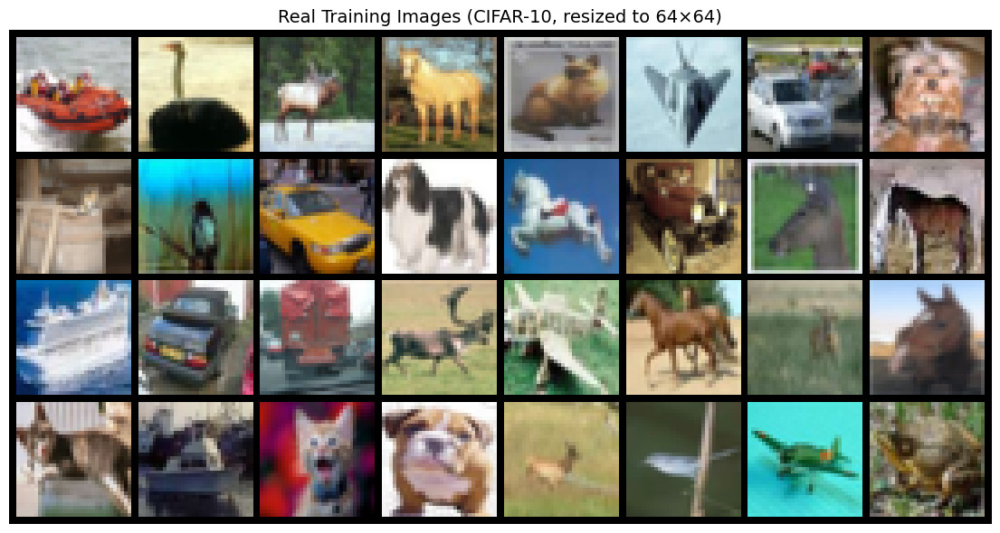

In [ ]:
# CELL 3: Data Preparation
# ─────────────────────────────────────────────────────────────────────────────
transform = transforms.Compose([
    transforms.Resize(IMAGE_SIZE),
    transforms.CenterCrop(IMAGE_SIZE),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # normalize to [-1, 1]
])

dataset = torchvision.datasets.CIFAR10(
    root='./data', train=True, download=True, transform=transform
)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2, pin_memory=True)

print(f"Dataset size: {len(dataset)} images")
print(f"Image shape after transform: {dataset[0][0].shape}")

# Visualise a batch of real images
real_batch = next(iter(dataloader))
plt.figure(figsize=(12, 6))
plt.axis("off")
plt.title("Real Training Images (CIFAR-10, resized to 64×64)", fontsize=14)
plt.imshow(np.transpose(
    vutils.make_grid(real_batch[0][:32], nrow=8, padding=2, normalize=True).cpu(),
    (1, 2, 0)
))
plt.tight_layout()
plt.savefig("real_images.png", dpi=120)
plt.show()


In [ ]:
# CELL 4: Weight Initialisation (standard for GANs)
# ─────────────────────────────────────────────────────────────────────────────
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


In [ ]:
# CELL 5: ── BASIC GAN ──  Deep Convolutional GAN (DCGAN)
# ─────────────────────────────────────────────────────────────────────────────

class DCGAN_Generator(nn.Module):
    """
    DCGAN Generator: maps latent vector z → RGB image via transposed convolutions.
    Architecture from Radford et al. (2015).
    """
    def __init__(self, nz=NZ, ngf=NGF, nc=NC):
        super().__init__()
        self.main = nn.Sequential(
          nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
          nn.BatchNorm2d(ngf * 8),
          nn.ReLU(True),

          nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
          nn.BatchNorm2d(ngf * 4),
          nn.ReLU(True),

          nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
          nn.BatchNorm2d(ngf * 2),
          nn.ReLU(True),

          nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
          nn.BatchNorm2d(ngf),
          nn.ReLU(True),

          nn.Conv2d(ngf, nc, 3, 1, 1, bias=False),  # ✅ NOT ConvTranspose
          nn.Tanh()
        )

    def forward(self, z):
        return self.main(z)


class DCGAN_Discriminator(nn.Module):
    """
    DCGAN Discriminator: maps RGB image → real/fake probability.
    """
    def __init__(self, nc=NC, ndf=NDF):
        super().__init__()
        self.main = nn.Sequential(
          nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
          nn.LeakyReLU(0.2, inplace=True),

          nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
          nn.BatchNorm2d(ndf * 2),
          nn.LeakyReLU(0.2, inplace=True),

          nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
          nn.BatchNorm2d(ndf * 4),
          nn.LeakyReLU(0.2, inplace=True),

          nn.Conv2d(ndf * 4, 1, 4, 1, 0, bias=False),  # ✅ FIXED
          nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)


# Instantiate DCGAN
netG_dc = DCGAN_Generator(NZ, NGF, NC).to(device)
netD_dc = DCGAN_Discriminator(NC, NDF).to(device)
netG_dc.apply(weights_init)
netD_dc.apply(weights_init)

print("DCGAN Generator:")
print(netG_dc)
print(f"\nTotal Generator params: {sum(p.numel() for p in netG_dc.parameters()):,}")


DCGAN Generator:
DCGAN_Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (13):

In [ ]:
# CELL 6: ── ADVANCED GAN ──  StyleGAN-Inspired Generator
# ─────────────────────────────────────────────────────────────────────────────

class MappingNetwork(nn.Module):
    """
    StyleGAN mapping network: z → w (disentangled latent space).
    8-layer MLP, key innovation of StyleGAN.
    """
    def __init__(self, nz=NZ, n_layers=8):
        super().__init__()
        layers = []
        for i in range(n_layers):
            layers += [nn.Linear(nz, nz), nn.LeakyReLU(0.2)]
        self.mapping = nn.Sequential(*layers)

    def forward(self, z):
        # Pixel-wise normalisation of z before mapping
        z = z / (z.norm(dim=1, keepdim=True) + 1e-8)
        return self.mapping(z)


class AdaIN(nn.Module):
    """
    Adaptive Instance Normalisation (AdaIN):
    Injects style (w) into feature maps. Core StyleGAN mechanism.
    y_s(w) * (x - μ(x)) / σ(x) + y_b(w)
    """
    def __init__(self, channels, nz=NZ):
        super().__init__()
        self.norm = nn.InstanceNorm2d(channels)
        self.style = nn.Linear(nz, channels * 2)  # scale + bias

    def forward(self, x, w):
        style = self.style(w).unsqueeze(2).unsqueeze(3)
        gamma, beta = style.chunk(2, dim=1)
        return gamma * self.norm(x) + beta


class StyleBlock(nn.Module):
    """Single synthesis block: Conv → AdaIN → Noise → Activation."""
    def __init__(self, in_ch, out_ch, nz=NZ):
        super().__init__()
        self.conv  = nn.ConvTranspose2d(in_ch, out_ch, 4, 2, 1, bias=False)
        self.adain = AdaIN(out_ch, nz)
        self.act   = nn.LeakyReLU(0.2)

    def forward(self, x, w):
        x = self.conv(x)
        x = self.adain(x, w)
        # Add per-pixel noise (stochastic detail injection)
        noise = torch.randn(x.size(0), 1, x.size(2), x.size(3), device=x.device)
        x = x + 0.1 * noise
        return self.act(x)


class StyleGAN_Generator(nn.Module):
    """
    Simplified StyleGAN Generator.
    Key features: mapping network, AdaIN style injection, progressive synthesis.
    """
    def __init__(self, nz=NZ, ngf=NGF, nc=NC):
        super().__init__()
        self.mapping  = MappingNetwork(nz)

        # Learned constant input (4x4)
        self.const    = nn.Parameter(torch.randn(1, ngf * 8, 4, 4))

        # Progressive upsampling synthesis blocks
        self.block1   = StyleBlock(ngf * 8, ngf * 4, nz)  # 4→8
        self.block2   = StyleBlock(ngf * 4, ngf * 2, nz)  # 8→16
        self.block3   = StyleBlock(ngf * 2, ngf,     nz)  # 16→32

        self.to_rgb   = nn.Sequential(
            nn.Conv2d(ngf, nc, 1, 1, 0),
            nn.Tanh()
        )

    def forward(self, z):
        if z.dim() > 2:
            z = z.view(z.size(0), -1)
        w = self.mapping(z)                          # map to W space
        x = self.const.expand(z.size(0), -1, -1, -1)
        x = self.block1(x, w)
        x = self.block2(x, w)
        x = self.block3(x, w)
        return self.to_rgb(x)


# Use same DCGAN discriminator for StyleGAN training
netG_style = StyleGAN_Generator(NZ, NGF, NC).to(device)
netD_style = DCGAN_Discriminator(NC, NDF).to(device)
netG_style.apply(weights_init)
netD_style.apply(weights_init)

print("StyleGAN-Inspired Generator:")
print(netG_style)
print(f"\nTotal StyleGAN Generator params: {sum(p.numel() for p in netG_style.parameters()):,}")


StyleGAN-Inspired Generator:
StyleGAN_Generator(
  (mapping): MappingNetwork(
    (mapping): Sequential(
      (0): Linear(in_features=100, out_features=100, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
      (2): Linear(in_features=100, out_features=100, bias=True)
      (3): LeakyReLU(negative_slope=0.2)
      (4): Linear(in_features=100, out_features=100, bias=True)
      (5): LeakyReLU(negative_slope=0.2)
      (6): Linear(in_features=100, out_features=100, bias=True)
      (7): LeakyReLU(negative_slope=0.2)
      (8): Linear(in_features=100, out_features=100, bias=True)
      (9): LeakyReLU(negative_slope=0.2)
      (10): Linear(in_features=100, out_features=100, bias=True)
      (11): LeakyReLU(negative_slope=0.2)
      (12): Linear(in_features=100, out_features=100, bias=True)
      (13): LeakyReLU(negative_slope=0.2)
      (14): Linear(in_features=100, out_features=100, bias=True)
      (15): LeakyReLU(negative_slope=0.2)
    )
  )
  (block1): StyleBlock(
    (conv): Con

In [ ]:
def train_gan(netG, netD, dataloader, num_epochs=NUM_EPOCHS,
              nz=NZ, model_name="GAN", save_interval=5):
    """
    Standard GAN training using binary cross-entropy loss.
    Returns: (G_losses, D_losses, img_list)
    """
    criterion  = nn.BCELoss()
    optimizerG = optim.Adam(netG.parameters(), lr=LR, betas=(BETA1, 0.999))
    optimizerD = optim.Adam(netD.parameters(), lr=LR, betas=(BETA1, 0.999))

    if model_name == "StyleGAN-Inspired":
        fixed_noise = torch.randn(64, nz, device=device)
    else:
        fixed_noise = torch.randn(64, nz, 1, 1, device=device)
    # fixed_noise = torch.randn(64, nz, 1, 1, device=device)

    real_label, fake_label = 1.0, 0.0
    G_losses, D_losses = [], []
    img_list = []

    save_dir = f"samples_{model_name.replace(' ', '_')}"
    os.makedirs(save_dir, exist_ok=True)

    print(f"\n{'='*60}")
    print(f"Training {model_name} for {num_epochs} epochs...")
    print(f"Samples will be saved to: {save_dir}/")
    print(f"{'='*60}")

    for epoch in range(num_epochs):
        epoch_G_loss = 0.0  # accumulate per epoch
        epoch_D_loss = 0.0

        for i, (real_imgs, _) in enumerate(dataloader):
            b_size    = real_imgs.size(0)
            real_imgs = real_imgs.to(device)

            # ── Train Discriminator ──────────────────────────────────────────
            netD.zero_grad()

            label       = torch.full((b_size,), real_label, device=device)
            out_real    = netD(real_imgs).view(-1)
            loss_D_real = criterion(out_real, label)
            loss_D_real.backward()

            if model_name == "StyleGAN-Inspired":
                noise = torch.randn(b_size, nz, device=device)   # ✅ FIX
            else:
                noise = torch.randn(b_size, nz, 1, 1, device=device)
            # noise       = torch.randn(b_size, nz, 1, 1, device=device)
            fake_imgs   = netG(noise)
            label.fill_(fake_label)
            out_fake    = netD(fake_imgs.detach()).view(-1)
            loss_D_fake = criterion(out_fake, label)
            loss_D_fake.backward()

            loss_D = loss_D_real + loss_D_fake
            optimizerD.step()

            # ── Train Generator ──────────────────────────────────────────────
            netG.zero_grad()
            label.fill_(real_label)
            out    = netD(fake_imgs).view(-1)
            loss_G = criterion(out, label)
            loss_G.backward()
            optimizerG.step()

            epoch_G_loss += loss_G.item()   # accumulate — no per-step print
            epoch_D_loss += loss_D.item()

        # ── Single log line per epoch ────────────────────────────────────────
        avg_G = epoch_G_loss / len(dataloader)
        avg_D = epoch_D_loss / len(dataloader)
        G_losses.append(avg_G)
        D_losses.append(avg_D)
        print(f"Epoch [{epoch+1:3d}/{num_epochs}] | Avg Loss_G: {avg_G:.4f} | Avg Loss_D: {avg_D:.4f}")

        # ── Save sample grid every save_interval epochs (and epoch 1) ────────
        if (epoch + 1) % save_interval == 0 or epoch == 0:
            netG.eval()
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            netG.train()

            grid = vutils.make_grid(fake, nrow=8, padding=2, normalize=True)
            img_list.append(grid)

            save_path = os.path.join(save_dir, f"epoch_{epoch+1:04d}.png")
            vutils.save_image(fake, save_path, nrow=8, padding=2, normalize=True)

            fig, ax = plt.subplots(figsize=(12, 6))
            ax.axis("off")
            ax.set_title(
                f"{model_name} — Epoch {epoch+1}/{num_epochs} | "
                f"Avg Loss_G: {avg_G:.4f} | Avg Loss_D: {avg_D:.4f}",  # now shows avg loss
                fontsize=11, fontweight='bold'
            )
            ax.imshow(np.transpose(grid.numpy(), (1, 2, 0)))
            plt.tight_layout()
            plt.savefig(save_path.replace(".png", "_display.png"), dpi=100)
            plt.show()
            clear_output(wait=True)

            print(f"  → [Epoch {epoch+1}] Sample saved to {save_path}")

    print(f"\nTraining complete for {model_name}!")
    print(f"All epoch samples saved in: {save_dir}/")
    return G_losses, D_losses, img_list


# ── Train DCGAN ──────────────────────────────────────────────────────────────
G_losses_dc, D_losses_dc, img_list_dc = train_gan(
    netG_dc, netD_dc, dataloader,
    num_epochs=NUM_EPOCHS, model_name="DCGAN"
)

# ── Train StyleGAN ───────────────────────────────────────────────────────────
G_losses_st, D_losses_st, img_list_st = train_gan(
    netG_style, netD_style, dataloader,
    num_epochs=NUM_EPOCHS, model_name="StyleGAN-Inspired"
)

  → [Epoch 40] Sample saved to samples_StyleGAN-Inspired/epoch_0040.png

Training complete for StyleGAN-Inspired!
All epoch samples saved in: samples_StyleGAN-Inspired/


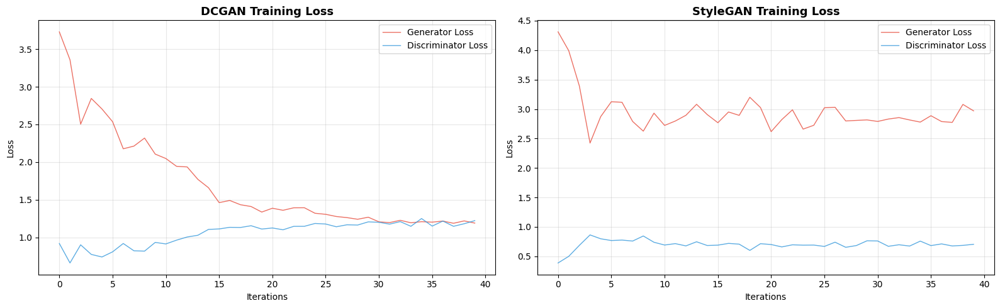

In [ ]:
# CELL 8: Plot Training Losses
# ─────────────────────────────────────────────────────────────────────────────

fig, axes = plt.subplots(1, 2, figsize=(16, 5))

for ax, g_loss, d_loss, title in zip(
    axes,
    [G_losses_dc, G_losses_st],
    [D_losses_dc, D_losses_st],
    ["DCGAN Training Loss", "StyleGAN Training Loss"]
):
    ax.plot(g_loss, label="Generator Loss",     color="#e74c3c", alpha=0.8, linewidth=1)
    ax.plot(d_loss, label="Discriminator Loss", color="#3498db", alpha=0.8, linewidth=1)
    ax.set_title(title, fontsize=13, fontweight='bold')
    ax.set_xlabel("Iterations")
    ax.set_ylabel("Loss")
    ax.legend()
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig("training_losses.png", dpi=120)
plt.show()


── DCGAN: 10 Artistic Samples ──


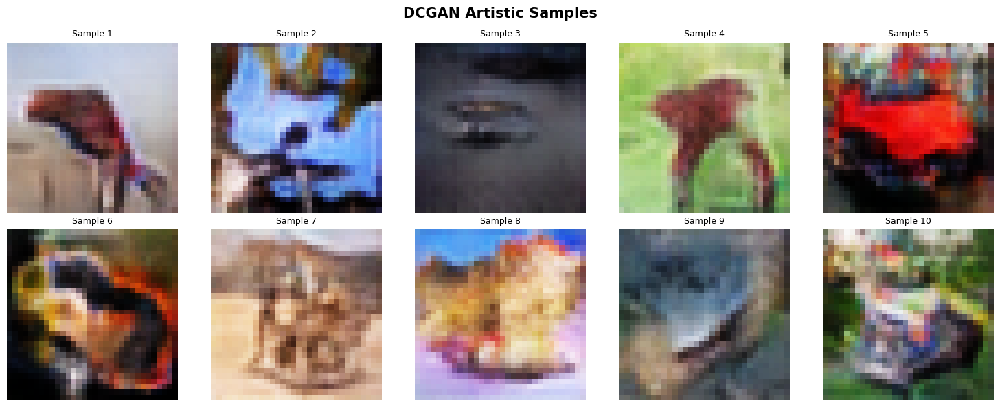

── StyleGAN: 10 Artistic Samples ──


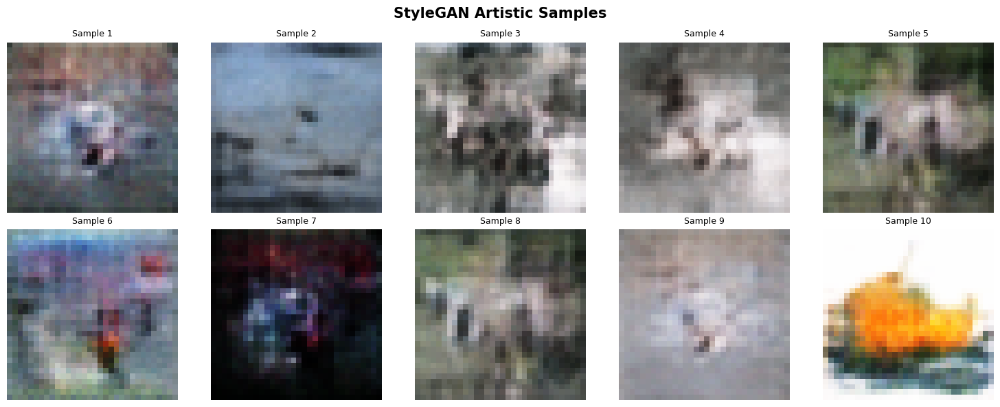

In [ ]:
# CELL 9: Generate 10 Artistic Image Samples
# ─────────────────────────────────────────────────────────────────────────────

def generate_artistic_samples(netG, nz=NZ, n_samples=10, title="Generated Samples"):
    """Generate and display n_samples artistic images."""
    netG.eval()
    with torch.no_grad():
        z = torch.randn(n_samples, nz, 1, 1, device=device)
        images = netG(z).cpu()

    fig, axes = plt.subplots(2, 5, figsize=(15, 6))
    fig.suptitle(title, fontsize=15, fontweight='bold')
    axes = axes.flatten()

    for i, ax in enumerate(axes):
        img = images[i].permute(1, 2, 0).numpy()
        img = (img + 1) / 2.0   # denormalize from [-1,1] to [0,1]
        img = np.clip(img, 0, 1)
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(f"Sample {i+1}", fontsize=9)

    plt.tight_layout()
    plt.savefig(f"{title.replace(' ', '_')}.png", dpi=120)
    plt.show()
    netG.train()


print("── DCGAN: 10 Artistic Samples ──")
generate_artistic_samples(netG_dc,    title="DCGAN Artistic Samples")

print("── StyleGAN: 10 Artistic Samples ──")
generate_artistic_samples(netG_style, title="StyleGAN Artistic Samples")


── DCGAN: Latent Space Interpolation ──


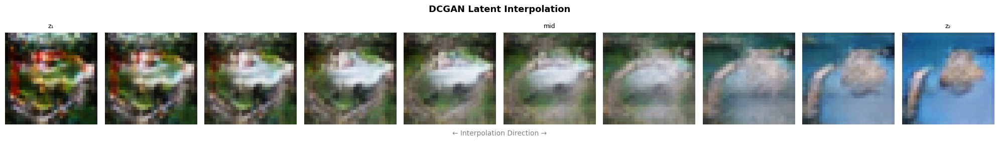

── StyleGAN: Latent Space Interpolation (W-space) ──


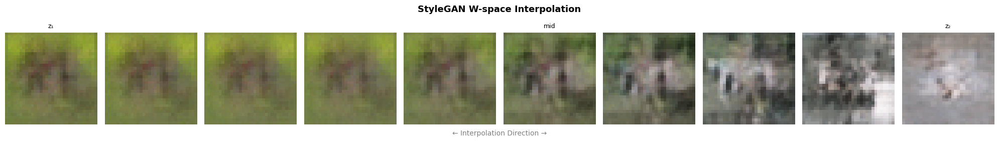

In [ ]:
# CELL 10: Latent Space Interpolation
# ─────────────────────────────────────────────────────────────────────────────

def interpolate_latent(netG, nz=NZ, n_steps=10, title="Latent Interpolation"):
    """
    Linearly interpolate between two random latent vectors z1 and z2.
    Shows smooth visual transitions — key concept of latent space exploration.
    """
    netG.eval()
    torch.manual_seed(42)
    z1 = torch.randn(1, nz, 1, 1, device=device)
    z2 = torch.randn(1, nz, 1, 1, device=device)

    alphas = torch.linspace(0, 1, n_steps)
    images = []

    with torch.no_grad():
        for alpha in alphas:
            # Spherical linear interpolation (slerp) for smoother results
            z_interp = (1 - alpha) * z1 + alpha * z2
            img = netG(z_interp).cpu().squeeze(0)
            images.append(img)

    # Plot
    fig, axes = plt.subplots(1, n_steps, figsize=(2 * n_steps, 2.5))
    fig.suptitle(title, fontsize=13, fontweight='bold', y=1.02)

    for i, (ax, img) in enumerate(zip(axes, images)):
        img_np = img.permute(1, 2, 0).numpy()
        img_np = np.clip((img_np + 1) / 2.0, 0, 1)
        ax.imshow(img_np)
        ax.axis('off')
        if i == 0:
            ax.set_title("z₁", fontsize=9)
        elif i == n_steps - 1:
            ax.set_title("z₂", fontsize=9)
        elif i == n_steps // 2:
            ax.set_title("mid", fontsize=9)

    # Arrow underneath
    fig.text(0.5, -0.02, "← Interpolation Direction →",
             ha='center', fontsize=10, color='gray')

    plt.tight_layout()
    plt.savefig(f"{title.replace(' ', '_')}.png", dpi=120, bbox_inches='tight')
    plt.show()
    netG.train()


print("── DCGAN: Latent Space Interpolation ──")
interpolate_latent(netG_dc,    title="DCGAN Latent Interpolation")

print("── StyleGAN: Latent Space Interpolation (W-space) ──")
interpolate_latent(netG_style, title="StyleGAN W-space Interpolation")


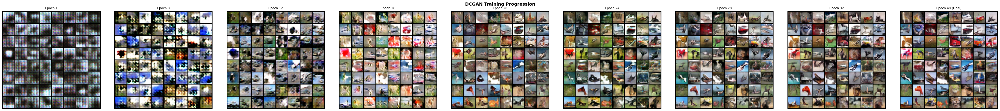

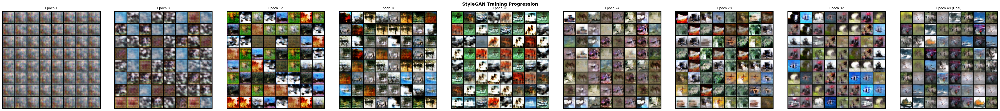

In [ ]:
# CELL 11: Compare Training Progression (Early vs Late Epochs)
# ─────────────────────────────────────────────────────────────────────────────

def show_training_progression(img_list, title="Training Progression"):
    n = len(img_list)
    fig, axes = plt.subplots(1, n, figsize=(5 * n, 5))
    if n == 1:
        axes = [axes]
    fig.suptitle(title, fontsize=14, fontweight='bold')

    epoch_labels = [f"Epoch {(i+1) * (NUM_EPOCHS // n)}" for i in range(n)]
    epoch_labels[0]  = "Epoch 1"
    epoch_labels[-1] = f"Epoch {NUM_EPOCHS} (Final)"

    for ax, img, label in zip(axes, img_list, epoch_labels):
        ax.imshow(np.transpose(img.numpy(), (1, 2, 0)))
        ax.axis('off')
        ax.set_title(label, fontsize=10)

    plt.tight_layout()
    plt.savefig(f"{title.replace(' ', '_')}.png", dpi=120)
    plt.show()


show_training_progression(img_list_dc,  "DCGAN Training Progression")
show_training_progression(img_list_st, "StyleGAN Training Progression")


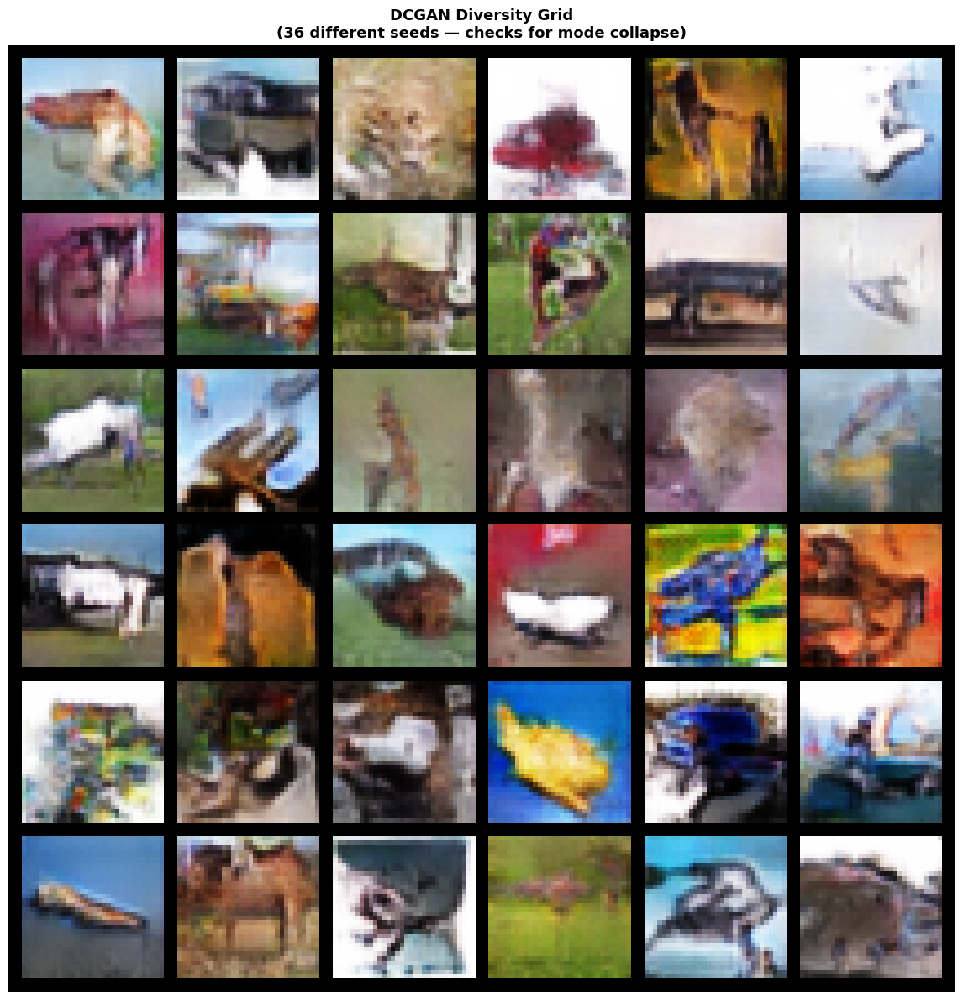

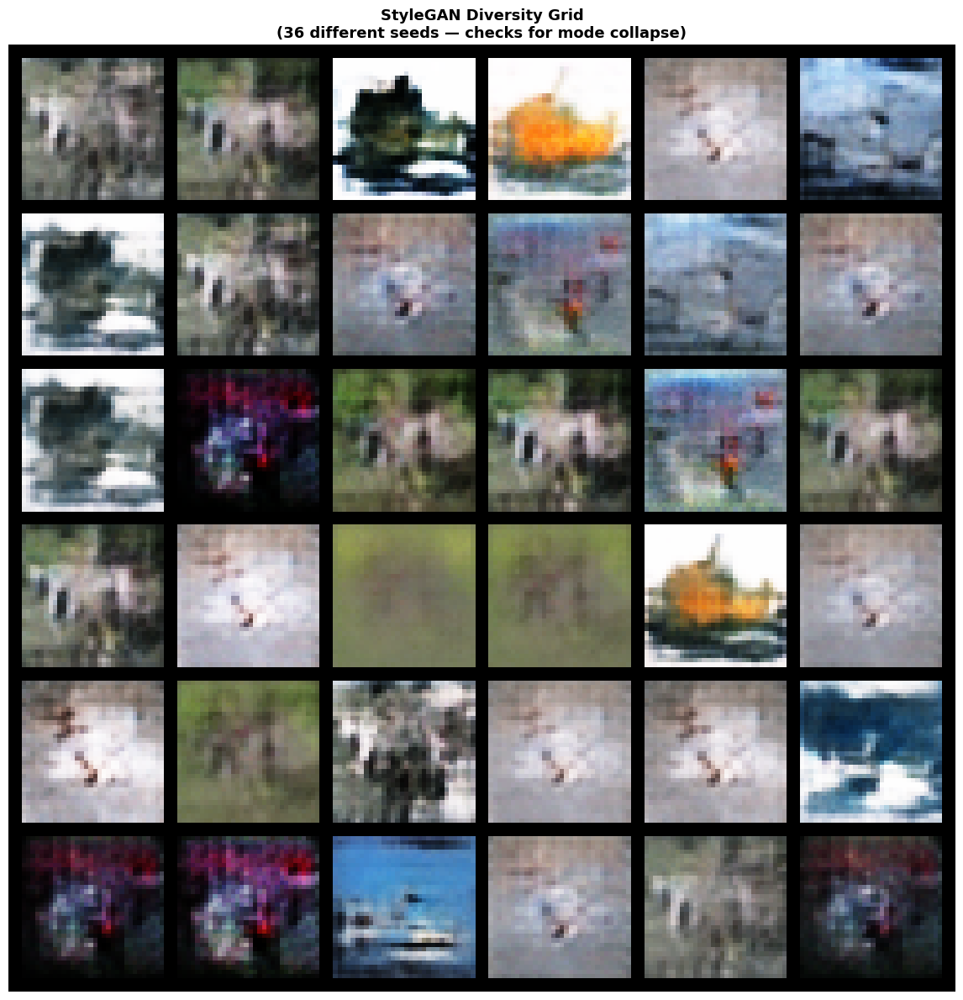

In [ ]:
# CELL 12: Latent Space Diversity Grid (seed-controlled)
# ─────────────────────────────────────────────────────────────────────────────

def diversity_grid(netG, nz=NZ, n=36, title="Diversity Grid"):
    """
    Generate a diverse grid from different random seeds to show
    how varied the GAN's outputs are — important for checking mode collapse.
    """
    netG.eval()
    all_imgs = []
    with torch.no_grad():
        for seed in range(n):
            torch.manual_seed(seed)
            z = torch.randn(1, nz, 1, 1, device=device)
            img = netG(z).cpu().squeeze(0)
            all_imgs.append(img)

    grid = vutils.make_grid(
        torch.stack(all_imgs), nrow=6, padding=3, normalize=True
    )

    plt.figure(figsize=(12, 12))
    plt.axis('off')
    plt.title(f"{title}\n(36 different seeds — checks for mode collapse)",
              fontsize=13, fontweight='bold')
    plt.imshow(np.transpose(grid.numpy(), (1, 2, 0)))
    plt.tight_layout()
    plt.savefig(f"{title.replace(' ', '_')}.png", dpi=120)
    plt.show()
    netG.train()


diversity_grid(netG_dc,    title="DCGAN Diversity Grid")
diversity_grid(netG_style, title="StyleGAN Diversity Grid")


In [ ]:
# CELL 13: Save Models
# ─────────────────────────────────────────────────────────────────────────────

os.makedirs("saved_models", exist_ok=True)
torch.save(netG_dc.state_dict(),    "saved_models/dcgan_generator.pth")
torch.save(netG_style.state_dict(), "saved_models/stylegan_generator.pth")
print("Models saved to saved_models/")


Models saved to saved_models/


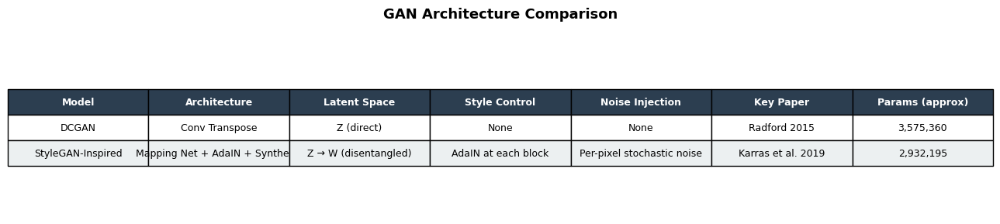


LAB COMPLETE — All outputs generated and saved!

Expected outputs:
  real_images.png                   → Real CIFAR-10 samples
  training_losses.png               → G/D loss curves
  DCGAN_Artistic_Samples.png        → 10 DCGAN artistic samples
  StyleGAN_Artistic_Samples.png     → 10 StyleGAN artistic samples
  DCGAN_Latent_Interpolation.png    → Smooth interpolation (z1 → z2)
  StyleGAN_W-space_Interpolation.png→ StyleGAN W-space interpolation
  DCGAN_Training_Progression.png    → Early vs late epoch quality
  DCGAN_Diversity_Grid.png          → 36-sample diversity check
  StyleGAN_Diversity_Grid.png       → 36-sample diversity check
  architecture_comparison.png       → Summary comparison table
  saved_models/                     → Trained model weights



In [ ]:
# CELL 14: Comparison Summary Table
# ─────────────────────────────────────────────────────────────────────────────

summary = {
    "Model":          ["DCGAN",          "StyleGAN-Inspired"],
    "Architecture":   ["Conv Transpose", "Mapping Net + AdaIN + Synthesis"],
    "Latent Space":   ["Z (direct)",     "Z → W (disentangled)"],
    "Style Control":  ["None",           "AdaIN at each block"],
    "Noise Injection":["None",           "Per-pixel stochastic noise"],
    "Key Paper":      ["Radford 2015",   "Karras et al. 2019"],
    "Params (approx)": [
        f"{sum(p.numel() for p in netG_dc.parameters()):,}",
        f"{sum(p.numel() for p in netG_style.parameters()):,}"
    ]
}

fig, ax = plt.subplots(figsize=(13, 3))
ax.axis('off')
table = ax.table(
    cellText=list(zip(*[v for v in summary.values()])),
    colLabels=list(summary.keys()),
    cellLoc='center', loc='center'
)
table.auto_set_font_size(False)
table.set_fontsize(9)
table.scale(1, 2)
for (row, col), cell in table.get_celld().items():
    if row == 0:
        cell.set_facecolor('#2c3e50')
        cell.set_text_props(color='white', fontweight='bold')
    elif row % 2 == 0:
        cell.set_facecolor('#ecf0f1')

plt.title("GAN Architecture Comparison", fontsize=13, fontweight='bold', pad=20)
plt.tight_layout()
plt.savefig("architecture_comparison.png", dpi=120, bbox_inches='tight')
plt.show()

print("\n" + "="*60)
print("LAB COMPLETE — All outputs generated and saved!")
print("="*60)
print("""
Expected outputs:
  real_images.png                   → Real CIFAR-10 samples
  training_losses.png               → G/D loss curves
  DCGAN_Artistic_Samples.png        → 10 DCGAN artistic samples
  StyleGAN_Artistic_Samples.png     → 10 StyleGAN artistic samples
  DCGAN_Latent_Interpolation.png    → Smooth interpolation (z1 → z2)
  StyleGAN_W-space_Interpolation.png→ StyleGAN W-space interpolation
  DCGAN_Training_Progression.png    → Early vs late epoch quality
  DCGAN_Diversity_Grid.png          → 36-sample diversity check
  StyleGAN_Diversity_Grid.png       → 36-sample diversity check
  architecture_comparison.png       → Summary comparison table
  saved_models/                     → Trained model weights
""")